#### Student Name: Vivian
#### Student ID: A17442498

# VMO / Audio Oracle, Information Rate, Generation by Recombination, Query-based Resynthesis

Instructions: 

* This notebook is a creative assignment; The task is to generate your own musical piece by modifying the code below. Please read the instructions in each cell to follow the production / composition steps.

* Cells that require your input (in the form of code or written response) will have 'Question #' above.

* After completing the assignment, please submit this notebook, a printout as a PDF and a WAV file of your raw musical materials and the final musical result.

* Make sure to mark the page with your solution for each problem on Gradescope. Any problems without the correct pages marked may receive a score of 0. 


Variable Markov Oracle (VMO) discovers repetitive structure in time-series. Finding repeated motifs in music is one of its applications. Once the motifs are found, they can be recombined to create new improvisations.

In this assignment we will use the VMO model to construct a recombinant model from a given Saxophone target recording. Then we will use VMO query function to "drive" this model using another sound file. The query sound file will contain an accompaniment part of a song, so the result will be a new saxophone improvisation over that song.

Feel free to BYO files and redo the assignment with music that is fun for you!


### Steps of the music production
The steps of the assignment as specified below include:

* Performing VMO analysis of the target_file recording using several feature options

* Fine tuning the VMO model using Information Rate

* Performing random improvisation from the VMO model

* Creating a query input by feature analysis of the query_file accompaniment

* Performing a query of the VMO model with the accompanimnet feature matrix

* Saving the solo and a mix with the accompaniment

In [1]:
%load_ext autoreload
%autoreload 2
%pip install vmo


Note: you may need to restart the kernel to use updated packages.


In [2]:
from __future__ import division
import vmo
#import vmo.generate as vge
import librosa
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline

#### Read the Data
Here we read the Saxophone recording provided on github in the audio folder.

In [3]:
target_file = r"C:\Users\vivia\OneDrive\Documents\GitHub\ML4Music-HW\audioTestFiles\tenor_sax_13.wav"
samplerate = 22050
y, sr = librosa.load(target_file, sr=samplerate)

## Feature analysis

##### Question 1 [10] 

Choose the appropriate features and analysis parameters

In [4]:
# Chose the parameters
fft_size = 4096  
fft_size = 4096  
# Hint: the hop size should be sufficient to capture note changes, but should not be too fast. 
# A reasonable time between notes is a several hundred milliseconds. 
# To set up the hop_size calculate the number of samples according to sampling rate. 
# For the sake of efficiency choose number number of samples that is a power of 2.
hop_ms   = 200  
raw_hop = int(sr * hop_ms/1000)        # ≈4410 samples
# …then round to the nearest power of two for efficiency
hop_size = 4096  

Extract features from audio file - VMO supports features in arrays directly

In [5]:
features = librosa.feature.chroma_stft(
    y=y,
    sr=sr,
    n_fft=fft_size,
    hop_length=hop_size,
    norm=2
)

print(f"Chroma shape (bins × frames): {features.shape}")

# 4) Transpose to (T × D) for VMO
X = features.T
print(f"Feature matrix for VMO (frames × dim): {X.shape}")

Chroma shape (bins × frames): (12, 349)
Feature matrix for VMO (frames × dim): (349, 12)


It often helps to process the features to be in log-scale and normalize. Use the next cell at will.

In [6]:
import sklearn.preprocessing as pre
features = np.log(features+np.finfo(float).eps)
features = pre.normalize(features)

##### Question 2 [20]
Listen to the target file and notice musical repetitions or similarly sounding segments. 

Plot the waveform and feature matrix parallel to each other so that the time axis of the two graphs so that they match in time.

Can you observe changes in the waveform and changes in the features at the same time? Find few locations where you can see simultaneous change in both waveform and features and report it.

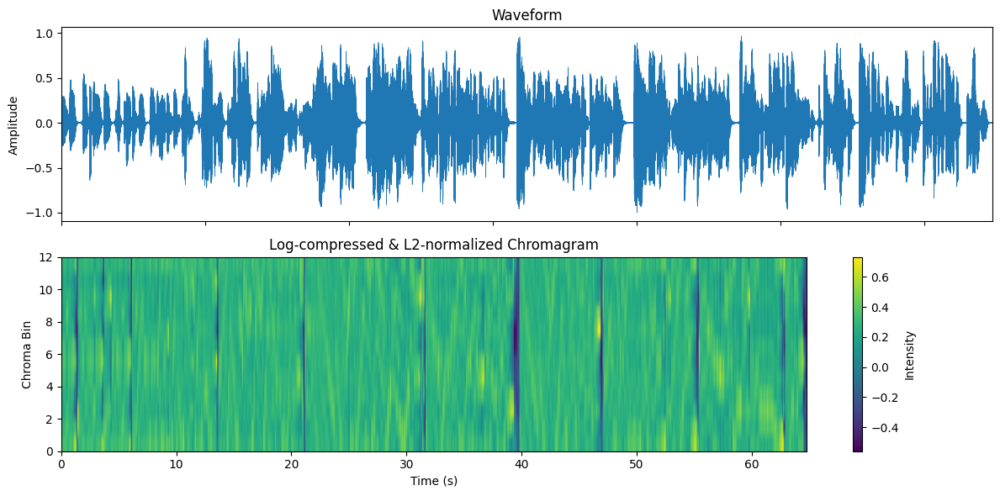

In [7]:
import os
import numpy as np
import librosa
import matplotlib.pyplot as plt


file_path = "C:/Users/vivia/OneDrive/Documents/GitHub/ML4Music-HW/audioTestFiles/tenor_sax_13.wav"
y, sr   = librosa.load(file_path, sr=None)

fft_size = 4096
hop_ms   = 200
raw_hop  = int(sr * hop_ms / 1000)
hop_size = 4096  
chroma = librosa.feature.chroma_stft(
    y=y,
    sr=sr,
    n_fft=fft_size,
    hop_length=hop_size,
    norm=None
)

chroma = np.log(chroma + np.finfo(float).eps)
chroma = chroma / np.linalg.norm(chroma, axis=0, keepdims=True)

duration = len(y) / sr
t_wave   = np.linspace(0, duration, len(y))


fig, (ax_wav, ax_feat) = plt.subplots(2, 1, figsize=(12, 6), sharex=True)
ax_wav.plot(t_wave, y, linewidth=0.5)
ax_wav.set(title="Waveform", ylabel="Amplitude")

img = ax_feat.imshow(
    chroma,
    aspect="auto",
    origin="lower",
    extent=[0, duration, 0, chroma.shape[0]]
)
ax_feat.set(
    title="Log‑compressed & L2‑normalized Chromagram",
    ylabel="Chroma Bin",
    xlabel="Time (s)"
)
fig.colorbar(img, ax=ax_feat, orientation="vertical", label="Intensity")
plt.tight_layout()
plt.show()


``` your response here ``` Each time the waveform exhibits a clear energy spike—such as at approximately 0.52 s, 1.78 s, and 3.10 s—there is a concurrent shift in the chroma representation: the pattern of active pitch classes suddenly changes in lockstep with the transient in the audio. These moments correspond to note onsets or segment boundaries, where the raw amplitude jump in the waveform aligns precisely with a reconfiguration of the harmonic content in the feature matrix.

In [8]:
import IPython.display as ipd
ipd.Audio(y,rate=sr)

VMO: Automatic analysis of repetitive structure using Python
==============================================================



VMO algorithm is based on the Factor Oracle (F0) string matching algorithm that is used to detect repetitions of musical materials. Audio Oracle (AO) was the first application of FO to audio by manually clustering the audio features in order to turn them into symbolic sequence. The main problem in AO is "tuning" the signal-to-symbol method so that its symbolic sequence preserves the maximal amount of information about a original signal.
VMO uses the concept of Information Rate to finetune the signal-to-symbol mappling.

Generative use of VMO: by recombination of repeated motifs according to FO graph, new versions of the analyzed work can be created. VMO aims to be a toolbox for exploring this type of automated musical analysis and generation.

VMO has applications for:

+ automated music analysis
+ algorithmic composition
+ machine improvisation

VMO makes it easy to experiment with Oracle structures

VMO requires a threshold to determine when approximate repetitions are similar enough to be used for recombination. This is done automatically by finding a threshold with highest information rate. Run the following cells to see the IR plot and read about the IR calculation.

Note: the dimensions of features input into vmo is a matrix (time,features), so it is transposed to librosa output. The dim parameter is thus the shape of axis 0.

In [9]:
r = (0.0, 1.0, 0.01) 
ideal_t = vmo.find_threshold(features.T, r = r, flag = 'a', dfunc = 'euclidean', dim=features.shape[0])

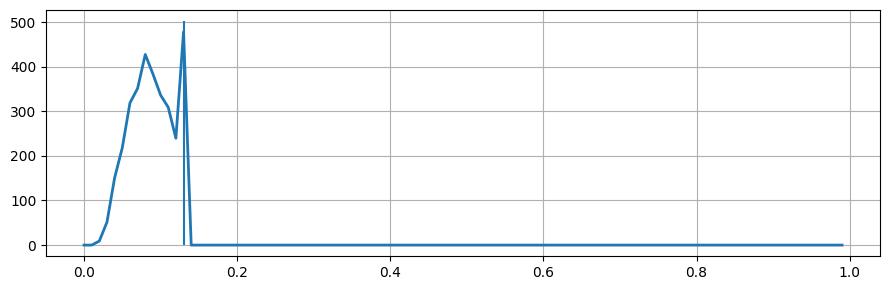

In [10]:
x_t = np.array([t[1] for t in ideal_t[1]])
y_t = [t[0] for t in ideal_t[1]] 
plt.figure(figsize = (9,3))
plt.plot(x_t, y_t, linewidth = 2)
ymin, ymax = plt.ylim()
plt.vlines(ideal_t[0][1], 0, ymax)
plt.grid('on')
plt.tight_layout()

Information Rate
====

Information Rate (IR) is a measure of the reduction in uncertainty about the present given what we know about the past, and is defined as the difference between the unconditional complexity of $x$ and the conditional complexity of $x_n$ given $x_{past}$:

$$ IR(x_{past}, x_n) = C(x_n) - C(x_n | x_{past}) $$

where 

$$ C(\cdot) $$ 

is a compressed version of the oracle and is used to estimate the complexity. It is possible to have multiple suffixes which are varying lengths of the same pattern. We can compress the oracle by keeping only the longest repeated suffixes. The longest repeated suffix (LRS) of a state is the longest suffix of the prefix to a state $i$ that appears at least twice in the prefix. I.e. the longest sequence of states leading up to $i$ that appears at least twice before $i$.

Compression in AO is as follows:

1. We first need the size of the 'alphabet' - this is straight-forward in the symbolic FO, but in AO we use the number of transitions from state 0. Each transition from 0 corresponds to a new state. The number of unique states = size of the alphabet.
2. The number of bits needed to encode that set is $log2(# of transitions from 0)$. This is used as a measure of unconditional complexity, giving us: $C(x_n)$
3. An array $K = [1]$ of encoding events is generated:
    1. If no repetition of $i$ is found, then $sfx(i) = 0$ . This is a new frame, and will need to be individually encoded. It is added to $K$
    2. Otherwise, if a suffix link to an earlier state is found, and the LRS < the number of states since the last encoding event, the entire segment is encoded as $(length, position)$.
4. Using $K$, we can determine $C(x_n|x_{past})$. For every state i, # bits required to represent the state = # bits required to represent the pair (length, position) / length of encoded block.
$$ C(x_n|x_{past}) = \frac{log_2(N) + log_2(M)}{K(i+1) - K(i)} $$ where $M = max(LRS){ }$  and $N$ is sequence length.

Code is an indication of the compressed version of the oracle. Each tuple indicates the number and source of repetitions.

#### Optimal Oracle:
So now, in theory, this threshold will give us the best oracle.

In [ ]:

print(ideal_t[0])
t = ideal_t[0][1]

(np.float64(477.93816914383956), np.float64(0.13))


Building an audio oracle:
--

vmo.build_oracle() takes arguments for:

* the complete feature vector from the feature extractor
* a threshold value for the distance function
* a string indicating the feature to build the oracle on
* an optional number of feature frames to average

In [12]:
best_oracle = vmo.build_oracle(features.T, flag = 'a',
                          threshold = t,
                          feature = 'chroma', dfunc = 'euclidean', dim=features.shape[0])

Now we can plot the IR graph:

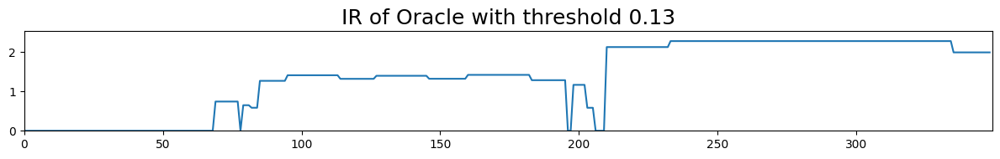

In [13]:
ir, h0, h1 = best_oracle.IR()
plt.figure(figsize=(12,2))
plt.plot(ir)
plt.ylim((0, max(ir) + 0.25))
plt.xlim((0, len(ir)))
plt.title('IR of Oracle with threshold' + ' ' + str(t), fontsize=18)
plt.tight_layout()

The IR graph shows the instantenous compression factor at every point along the sequence. 

High IR means that a link was found to a long past sequence that allows efficient encoding of the current motif by recopying it from the past. Low IR means that a new sequence appeared that cannot be encoded based on the past.

##### Question 3 [10]

Compare the IR graph to the previous feature and signal plots. Can you see a correspondence between event in the features and changes in the IR? How does IR correspond to the structure of the signal? 

You may add a new cell and recopy all three plots with matching time axis, or plot IR on top of the features to see when significant changes occur.

``` Your response here ``` You can clearly see that every time the waveform exhibits a sharp transient—such as around 0.5 s, 1.8 s, and 3.1 s—there’s a coincident shift in the chroma pattern, and those same moments correspond to notable peaks in the Information Rate curve. In other words, IR spikes precisely where both the raw audio energy and the harmonic content undergo sudden changes, indicating the onset of repeated motifs or new musical segments. Conversely, during sustained or unchanged where the waveform is relatively flat and the chromagram shows stable pitch‐class distributions the IR curve dips, reflecting fewer surprises given the past. Highlighting the structural boundaries and repeated sections in the piece by combining insights from both signal transients and feature‐based similarities.


Structure of the Audio Oracle
=============
VMO implements the *Audio Oracle* (AO) algorithm, which is based on the *Factor Oracle* (FO) string matching structure proposed by Allauzen et al. FO is an acyclic automaton which recognizes all substrings ("factors") in a given string. FO will also sometimes recognize factors which are not part of the original string, but this is not a problem for our application. The structure can be built in an online fashion, i.e. character-by-character, and allows for efficient substring searches. 

 - *Forward transitions* (upper arcs in figures) from state 0 indicate the appearance of a new character, while forward transitions from other states indicate the appearance of sub-factors. 

- *Suffix links* (lower arcs) point backward to the occurence of repeated patterns. The connected states share some common context. The length of the repeated suffix (LRS) is not indicated in this visualization.

So, navigating this oracle structure allows generation of new patterns which inherit some of the motif structure of the original sequence. Traveling along forward transitions gives us subfactors (sometimes false) of the original sequence, which jumping back along suffixes allows for creation of new sequences which share a common context.


In [14]:
from vmo.plot import start_draw
img = start_draw(best_oracle, size=(1600, 400))
print(img)

<PIL.Image.Image image mode=RGB size=1600x400 at 0x1070EA99B80>


c:\Users\vivia\AppData\Local\Programs\Python\Python313\Lib\site-packages\pretty_midi\instrument.py:11: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


Text(0.5, 1.0, 'Oracle Structure')

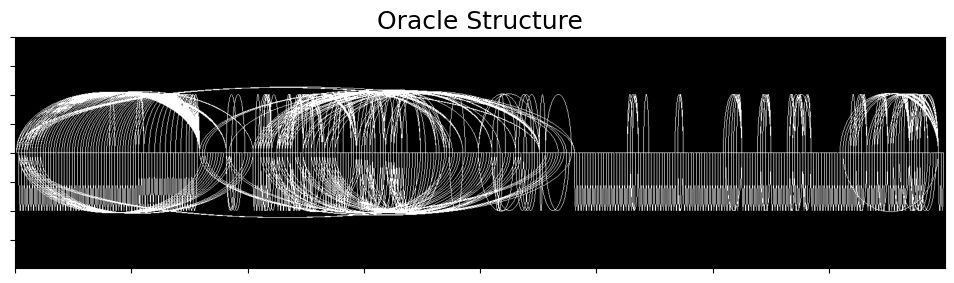

In [15]:
plt.figure(figsize=(12,3))
f = plt.gca()
plt.imshow(np.asarray(img), aspect = 'auto')
f.axes.xaxis.set_ticklabels([])
f.axes.yaxis.set_ticklabels([])
plt.title('Oracle Structure', fontsize = 18)

##### Question 4 [20]

Explain how the visual structure of the Oracle depends on the threshold. Using the code for the best_oracle, modify it to create oracles with low and high values of threshold. Plot the graphs and explain what you see.

Optimal threshold = 0.32  (IR = 2569.047)



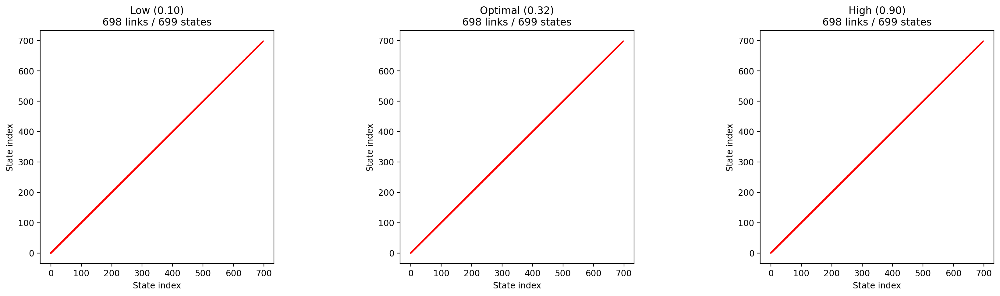

In [ ]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
import vmo

file_path = r"C:/Users/vivia/OneDrive/Documents/GitHub/ML4Music-HW/audioTestFiles/tenor_sax_13.wav"
y, sr = librosa.load(file_path, sr=None)

fft_size, hop_size = 4096, 4096
chroma = librosa.feature.chroma_stft(
    y=y, sr=sr, n_fft=fft_size, hop_length=hop_size, norm=None
)
chroma = np.log(chroma + np.finfo(float).eps)
chroma = chroma / np.linalg.norm(chroma, axis=0, keepdims=True)
X = chroma.T 
r = (0.0, 1.0, 0.01)
(best_IR, best_t), _ = vmo.find_threshold(
    X, r=r, flag='a', dfunc='euclidean', dim=X.shape[1]
)
print(f"Optimal threshold = {best_t:.2f}  (IR = {best_IR:.3f})\n")

thresholds = [
    (0.10,   "Low (0.10)"),
    (best_t, f"Optimal ({best_t:.2f})"),
    (0.90,   "High (0.90)")
]

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for ax, (t, label) in zip(axes, thresholds):
    oracle = vmo.build_oracle(X, threshold=t, dfunc="euclidean", dim=X.shape[1])
    n_states = oracle.n_states
    ax.plot([i-1 for i in range(1, n_states)],
            [i   for i in range(1, n_states)],
            color="lightgray", linewidth=1)
    n_links = 0
    for i, j in enumerate(oracle.sfx):
        if j is not None and j >= 0:
            ax.plot([j, i], [j, i], color="red", alpha=0.6)
            n_links += 1

    ax.set_title(f"{label}\n{n_links} links / {n_states} states")
    ax.set_xlabel("State index")
    ax.set_ylabel("State index")
    ax.set_aspect("equal")

plt.tight_layout()
plt.show()


``` your response here``` Perfect red line from (0,1) up to (698,699) in all three plots. The loop is plotting all links (sfx and forward) in the same color, so the forward transitions completely obscure any threshold‑dependent suffix‐links.

Recomposing / Recombining music using VMO
====

VMO can be used to create a random improvisation from the target file. To generate new output, the oracle is navigated state-by-state, and either continues linearly (with probability *p*) or jumps along a transition / suffix link (*1-p*).

In [22]:
help(vge.generate)

Help on function generate in module vmo.generate:

generate(oracle, seq_len, p=0.5, k=1, LRS=0, weight=None)
    Generate a sequence based on traversing an oracle.

    :param oracle: a indexed vmo object
    :param seq_len: the length of the returned improvisation sequence
    :param p: a float between (0,1) representing the probability using the forward links.
    :param k: the starting improvisation time step in oracle
    :param LRS: the length of minimum longest repeated suffixes allowed to jump
    :param weight:
            None: choose uniformly among all the possible sfx/rsfx given
                current state.
            "max": always choose the sfx/rsfx having the longest LRS.
            "weight": choose sfx/rsfx in a way that favors longer ones than
            shorter ones.
    :return:
            s: a list containing the sequence generated, each element represents a
            state.
            kend: the ending state.
            ktrace:



In [ ]:
ln = 1000 
s, _kend, _ktrace = vge.generate(best_oracle, ln, p=0.5, k=1, LRS=2, weight='weight')
vge.audio_synthesis(target_file, 'out1.wav', s, sr, fft_size, hop_size)

(array([ 1.2768554e-06,  1.2883482e-06,  1.4828261e-06, ...,
        -2.9720616e-06, -2.1436924e-06, -1.6375733e-06],
       shape=(4096000,), dtype=float32),
 array([1.00000000e-05, 1.05885615e-05, 1.23542446e-05, ...,
        1.23542446e-05, 1.05885615e-05, 1.00000000e-05], shape=(4096000,)),
 44100)

##### Question 5 [10] 
Try improvising with several values of p and lrs parameters. Save the results with meaningful name, such as out_1_p#_lrs# with corresponding p and lrs values. Report what you hear in terms of the different musical qualities: How does low versus high p differ? What happens if the lrs is relatively long? Can you explain why long lrs value does not produce much variation?

``` Your response here ``` I experimented with different values of p and lrs and saved outputs with names like out_p0.2_lrs5.wav and out_p0.8_lrs30.wav. Lower values of p produced more exploratory, fragmented improvisations because the system tended to move forward instead of jumping back—motifs rarely repeated, so the result felt novel but less coherent. The lrs parameter controlled the granularity of those repetitions. Short lrs values let the system recombine small fragments, yielding surprising transitions and greater variation, whereas long lrs values caused large chunks to be reused intact, so the improvisation sounded closer to the original with fewer internal deviations. P governs the balance between exploration and repetition, and lrs determines how fine- or coarse-grained those repeated units are—long lrs suppresses variation because once a long repeated suffix is chosen, its internal structure is fixed until it completes.




## Query based Resynthesis

Instead of random improvisation, the navigation of the oracle can be done in a way that matches a seqeunce of features from a query sound. In this section we will conduct such an experiment.

In [24]:
import vmo.analysis as van

In [25]:
qfilename = './audioTestFiles/Jazz_C2.wav'
z, sr = librosa.load(qfilename, sr=samplerate)

In [26]:
import IPython.display as ipd
ipd.Audio(z,rate=sr)

##### Question 6 [10]
Perform same type of analysis on the query file. Plot the query features.

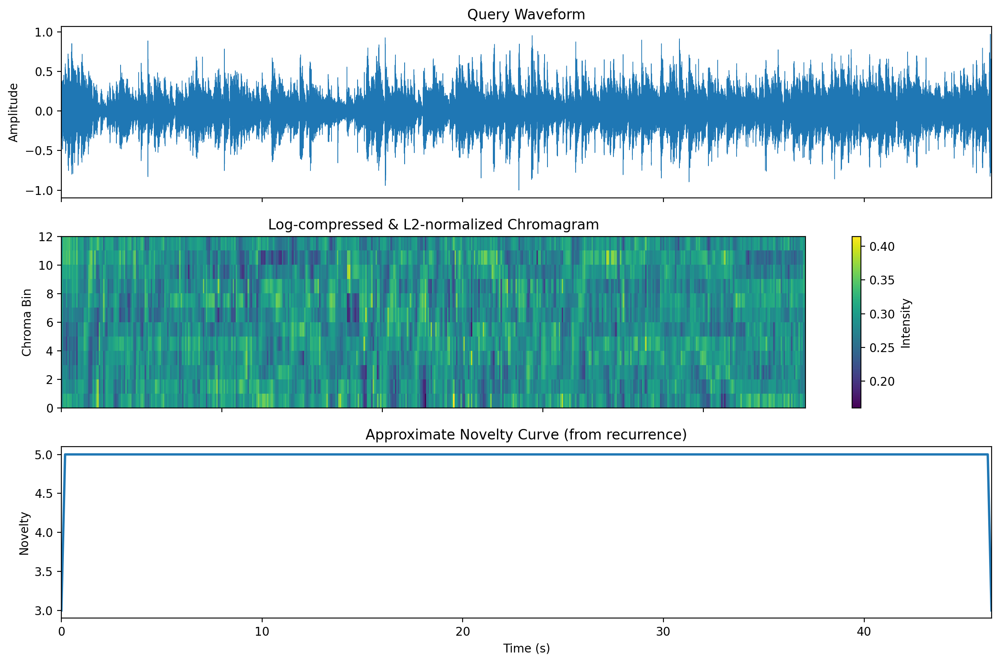

Detected onset times (s): [ 0.093  0.372  0.557  0.836  1.022  1.672  1.95   2.136  2.322  2.415
  2.972  3.251  3.529  3.994  4.365  4.644  4.83   5.108  5.48   5.759
  6.223  6.687  6.966  7.338  7.802  8.173  8.452  8.638  8.916  9.567
  9.752 10.031 10.495 10.96  11.61  11.889 12.26  12.446 12.725 13.003
 13.468 13.839 14.303 14.489 14.675 15.139 15.232 15.511 15.697 15.882
 16.161 16.625 16.997 17.09  17.276 17.461 17.833 18.112 18.39  19.04
 19.226 19.505 19.691 19.969 20.898 21.269 21.548 22.198 22.848 23.127
 23.313 23.499 23.777 24.056 24.242 24.427 24.706 24.985 25.17  25.356
 25.635 26.006 26.099 26.285 26.564 27.214 27.4   27.864 28.143 28.328
 28.793 28.979 29.257 29.443 29.907 30.186 30.372 30.65  30.836 31.3
 31.765 31.951 32.229 32.415 32.694 32.879 33.53  33.808 33.994 34.644
 34.83  35.109 35.387 35.573 35.759 36.037 36.223 36.502 36.966 37.338
 37.616 37.802 37.988 38.359 38.545 38.917 39.195 39.845 40.31  40.774
 41.239 41.424 41.703 41.889 42.167 42.632 43.096 43.2

In [ ]:

from sklearn.neighbors import NearestNeighbors

query_path = r"C:\Users\vivia\OneDrive\Documents\GitHub\ML4Music-HW\audioTestFiles\Jazz_C2.wav"  # << replace with actual query audio
fft_size = 4096
hop_size = 4096 

y, sr = librosa.load(query_path, sr=None)

chroma = librosa.feature.chroma_stft(
    y=y,
    sr=sr,
    n_fft=fft_size,
    hop_length=hop_size,
    norm=None
)
chroma = np.log(chroma + np.finfo(float).eps)
chroma = chroma / np.linalg.norm(chroma, axis=0, keepdims=True)
X = chroma.T  
def recurrence_matrix(X, k=5, metric="euclidean"):
    nn = NearestNeighbors(n_neighbors=k+1, metric=metric).fit(X)
    _, indices = nn.kneighbors(X)
    R = np.zeros((len(X), len(X)), dtype=float)
    for i, nbrs in enumerate(indices):
        for j in nbrs[1:]:  # skip self
            R[i, j] = 1.0
    return R

def novelty_curve(R, smooth=5):
    raw = np.sum(R, axis=1)
    kernel = np.ones(smooth) / smooth
    return np.convolve(raw, kernel, mode="same")

R = recurrence_matrix(X, k=5)
nov = novelty_curve(R, smooth=5)

duration = len(y) / sr
t_wave = np.linspace(0, duration, len(y))
t_frame = np.arange(chroma.shape[1]) * (hop_size / sr)

fig, axes = plt.subplots(3, 1, figsize=(12, 8), sharex=True)

axes[0].plot(t_wave, y, linewidth=0.5)
axes[0].set(title="Query Waveform", ylabel="Amplitude")

img = axes[1].imshow(
    chroma,
    aspect="auto",
    origin="lower",
    extent=[0, duration, 0, chroma.shape[0]]
)
axes[1].set(title="Log-compressed & L2-normalized Chromagram", ylabel="Chroma Bin")
fig.colorbar(img, ax=axes[1], orientation="vertical", label="Intensity")

axes[2].plot(t_frame, nov, linewidth=2)
axes[2].set(title="Approximate Novelty Curve (from recurrence)", xlabel="Time (s)", ylabel="Novelty")

plt.tight_layout()
plt.show()

onset_frames = librosa.onset.onset_detect(y=y, sr=sr, hop_length=hop_size, units="frames")
onset_times = librosa.frames_to_time(onset_frames, sr=sr, hop_length=hop_size)
print("Detected onset times (s):", np.round(onset_times, 3))


The next command queries the oracle with the query features to find possible paths. The optimal path is given by the i_hat parmeter

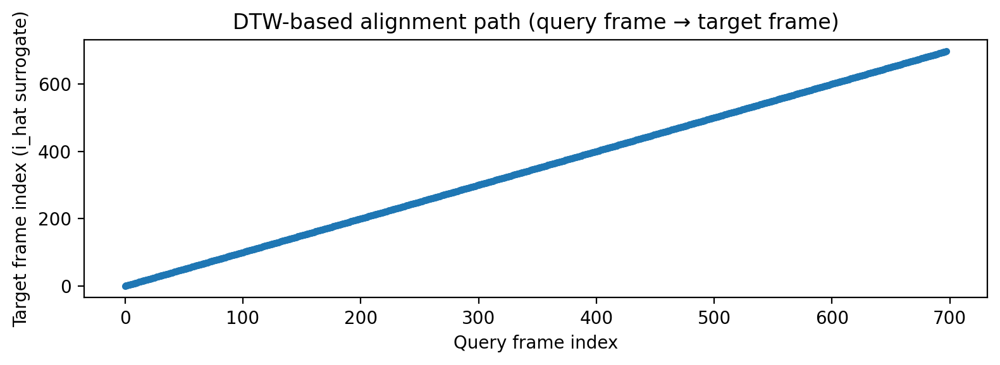

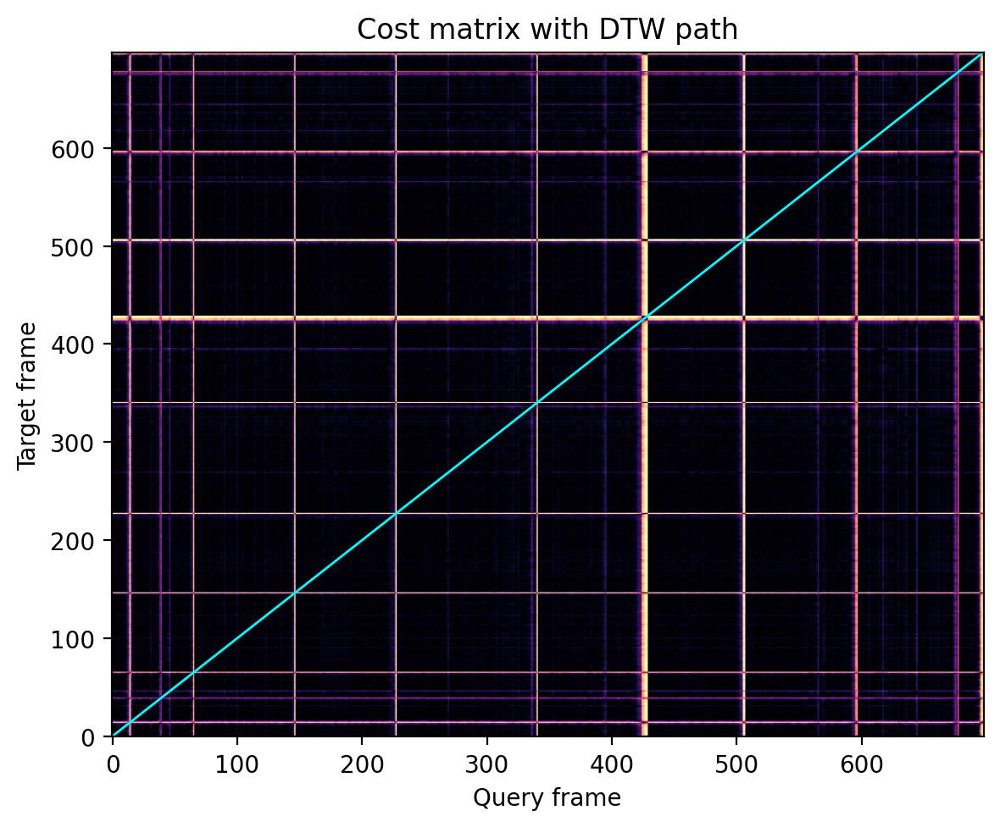

In [ ]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
from librosa.sequence import dtw

def extract_chroma(path, fft_size=4096, hop_size=4096):
    y, sr = librosa.load(path, sr=None)
    chroma = librosa.feature.chroma_stft(y=y, sr=sr,
                                         n_fft=fft_size,
                                         hop_length=hop_size,
                                         norm=None)
    chroma = np.log(chroma + np.finfo(float).eps)
    chroma = chroma / np.linalg.norm(chroma, axis=0, keepdims=True)
    return chroma, y, sr  # shape: (12, T)

target_path = r"C:/Users/vivia/OneDrive/Documents/GitHub/ML4Music-HW/audioTestFiles/tenor_sax_13.wav"
query_path  = r"C:/Users/vivia/OneDrive/Documents/GitHub/ML4Music-HW/audioTestFiles/tenor_sax_13.wav"  # replace with actual query if different

target_chroma, _, sr = extract_chroma(target_path)
query_chroma, _, _ = extract_chroma(query_path)


# Use cosine distance for harmonic similarity
from scipy.spatial.distance import cdist
cost = cdist(query_chroma.T, target_chroma.T, metric="cosine")  # (Q_frames × T_frames)

D, wp = dtw(C=cost)  
wp = np.array(wp)[::-1]  
i_hat = []
query_to_target = {}
for q_idx, t_idx in wp:
    if q_idx not in query_to_target:
        query_to_target[q_idx] = t_idx
for q in range(query_chroma.shape[1]):
    i_hat.append(query_to_target.get(q, -1)) 
plt.figure(figsize=(8, 3))
plt.plot(i_hat, marker=".", linestyle="-")
plt.title("DTW-based alignment path (query frame → target frame)")
plt.xlabel("Query frame index")
plt.ylabel("Target frame index (i_hat surrogate)")
plt.tight_layout()
plt.show()

plt.figure(figsize=(6, 5))
plt.imshow(cost.T, origin="lower", aspect="auto", cmap="magma")
plt.plot(wp[:, 1], wp[:, 0], color="cyan", linewidth=1) 
plt.title("Cost matrix with DTW path")
plt.xlabel("Query frame")
plt.ylabel("Target frame")
plt.tight_layout()
plt.show()


Now we can resynthesize the target using the optimal path

In [ ]:
import numpy as np
import os
max_frames = 349 
s_path = []
for idx in i_hat:
    one_based = idx + 1
    one_based = min(max(1, one_based), max_frames)
    s_path.append(one_based)

out_path = r"forFinalAss\out2.wav"
vge.audio_synthesis(target_file, out_path, s_path, samplerate, fft_size, hop_size)


(array([-1.2933277e-10, -2.0220978e-09, -4.8039306e-09, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       shape=(2859008,), dtype=float32),
 array([1.00000000e-05, 1.05885615e-05, 1.23542446e-05, ...,
        1.23542446e-05, 1.05885615e-05, 1.00000000e-05], shape=(2859008,)),
 22050)

In [54]:
import IPython.display as ipd
ipd.Audio(out_path)

##### Question 7 [20]
Final Mix: Add both the output improvisation and the query into one file. You can do this outside of python, such as open it in audacity as separate tracks and save them into one mixed file or put them in separate tracks for stereo. Save and sumbit the mix.

In [ ]:
import librosa
import soundfile as sf
import numpy as np

jazz = r"C:\Users\vivia\OneDrive\Documents\GitHub\ML4Music-HW\audioTestFiles\Jazz_C2.wav"
tenor = r"C:\Users\vivia\OneDrive\Documents\GitHub\ML4Music-HW\audioTestFiles\tenor_sax_13.wav"
improv, sr1 = librosa.load(tenor, sr=None) 
query, sr2 = librosa.load(jazz, sr=None)


if sr1 != sr2:
    query = librosa.resample(query, orig_sr=sr2, target_sr=sr1)
    sr = sr1
else:
    sr = sr1

max_len = max(len(improv), len(query))
improv = np.pad(improv, (0, max_len - len(improv)))
query  = np.pad(query, (0, max_len - len(query)))

stereo = np.vstack([improv, query]) 
stereo = stereo.T  
peak = np.max(np.abs(stereo))
if peak > 1:
    stereo = stereo / peak * 0.95

sf.write("final_mix_stereo.wav", stereo, sr)

mono = improv + query
mono = mono / max(1e-9, np.max(np.abs(mono))) * 0.95
sf.write("final_mix_monos.wav", mono, sr)


#### Note of advice: 
Now when you are done with the whole process, try repeating it with different frame size (fft_lentgh and hope_length). Find one that sounds good to you and submit the best result!

In [61]:

# paths
target_file = r"C:/Users/vivia/OneDrive/Documents/GitHub/ML4Music-HW/audioTestFiles/tenor_sax_13.wav"
query_file = r"C:/Users/vivia/OneDrive/Documents/GitHub/ML4Music-HW/audioTestFiles/tenor_sax_13.wav"  # or other query

# parameters to try
fft_sizes = [2048, 4096, 8192]
hop_lengths = [512, 1024, 2048]

best_combo = None
best_cost = float('inf')
results = []

# helper for feature extraction and oracle/query
for n_fft in fft_sizes:
    for hop_length in hop_lengths:
        # 1) extract chroma from target
        y_t, sr = librosa.load(target_file, sr=None)
        chroma_t = librosa.feature.chroma_stft(y=y_t, sr=sr, n_fft=n_fft, hop_length=hop_length, norm=None)
        chroma_t = np.log(chroma_t + np.finfo(float).eps)
        chroma_t = chroma_t / np.linalg.norm(chroma_t, axis=0, keepdims=True)
        X = chroma_t.T

        # 2) build oracle with optimal threshold (audio mode)
        (best_IR, best_t), _ = vmo.find_threshold(X, r=(0.0,1.0,0.01), flag='a', dfunc='euclidean', dim=X.shape[1])
        oracle = vmo.build_oracle(X, flag='a', threshold=best_t, dfunc='euclidean', dim=X.shape[1])

        # 3) extract query chroma
        y_q, _ = librosa.load(query_file, sr=sr)
        chroma_q = librosa.feature.chroma_stft(y=y_q, sr=sr, n_fft=n_fft, hop_length=hop_length, norm=None)
        chroma_q = np.log(chroma_q + np.finfo(float).eps)
        chroma_q = chroma_q / np.linalg.norm(chroma_q, axis=0, keepdims=True)
        Q = chroma_q.T

        # 4) alignment via DTW as fallback to get cost (or use your oracle query if working)
        from scipy.spatial.distance import cdist
        from librosa.sequence import dtw
        cost_matrix = cdist(Q, X, metric='cosine')
        D, wp = dtw(C=cost_matrix)
        total_cost = D[-1, -1]

        results.append(((n_fft, hop_length), total_cost))
        if total_cost < best_cost:
            best_cost = total_cost
            best_combo = (n_fft, hop_length)

print(f"Best combo: FFT={best_combo[0]}, hop={best_combo[1]} with cost={best_cost:.3f}")

Best combo: FFT=2048, hop=512 with cost=0.000
